In [1]:
import os
import xml.etree.ElementTree as ET
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt

2024-11-18 16:37:11.095021: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-18 16:37:11.162202: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-18 16:37:11.183909: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-18 16:37:11.228435: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-18 16:37:12.313876: W tensorflow/compiler/tf2

In [2]:
data_dir = "data"
train_dir = os.path.join(data_dir, "train")
valid_dir = os.path.join(data_dir, "valid")
test_dir = os.path.join(data_dir, "test")
image_size = (640, 640)
batch_size = 10

In [3]:
def parse_annotations(image_path, annotation_path, max_objects=10):
    tree = ET.parse(annotation_path)
    root = tree.getroot()
    image = load_img(image_path, target_size=image_size)
    image = img_to_array(image) / 255.0
    bboxes = []
    for obj in root.findall("object"):
        bndbox = obj.find("bndbox")
        xmin = int(bndbox.find("xmin").text)
        ymin = int(bndbox.find("ymin").text)
        xmax = int(bndbox.find("xmax").text)
        ymax = int(bndbox.find("ymax").text)
        bboxes.append([xmin, ymin, xmax, ymax])
    bboxes = bboxes[:max_objects]
    bboxes += [[0, 0, 0, 0]] * (max_objects - len(bboxes))

    return image, np.array(bboxes).flatten()

In [4]:
# Updated generator
def data_generator(directory, max_objects=10):
    image_files = [f for f in os.listdir(directory) if f.endswith(".jpg")]
    annotation_files = [f.replace(".jpg", ".xml") for f in image_files]
    while True:
        for image_file, annotation_file in zip(image_files, annotation_files):
            image_path = os.path.join(directory, image_file)
            annotation_path = os.path.join(directory, annotation_file)
            image, bboxes = parse_annotations(image_path, annotation_path, max_objects)
            yield image, bboxes

In [5]:
# Updated tf.data dataset
def create_dataset(directory, max_objects=10):
    generator = lambda: data_generator(directory, max_objects)
    dataset = tf.data.Dataset.from_generator(
        generator,
        output_signature=(
            tf.TensorSpec(shape=(image_size[0], image_size[1], 3), dtype=tf.float32),
            tf.TensorSpec(shape=(4 * max_objects,), dtype=tf.float32)  # Adjusted for padded bounding boxes
        )
    )
    return dataset.batch(batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

max_objects = 10
train_dataset = create_dataset(train_dir, max_objects=max_objects)
valid_dataset = create_dataset(valid_dir, max_objects=max_objects)
test_dataset = create_dataset(test_dir, max_objects=max_objects)
def count_samples(directory):
    return len([f for f in os.listdir(directory) if f.endswith(".jpg")])
# Count samples
train_samples = count_samples(train_dir)
valid_samples = count_samples(valid_dir)
test_samples = count_samples(test_dir)
# Print counts for verification
print(f"Train samples: {train_samples}")
print(f"Validation samples: {valid_samples}")
print(f"Test samples: {test_samples}")


I0000 00:00:1731976633.757184  499291 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1731976634.049518  499291 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1731976634.049759  499291 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1731976634.062939  499291 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1731976634.063219  499291 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:0

Train samples: 3664
Validation samples: 359
Test samples: 180


Visualizing the first 5 training images...


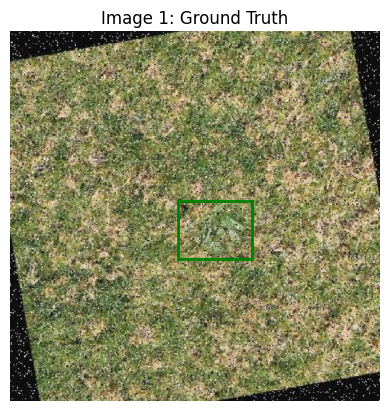

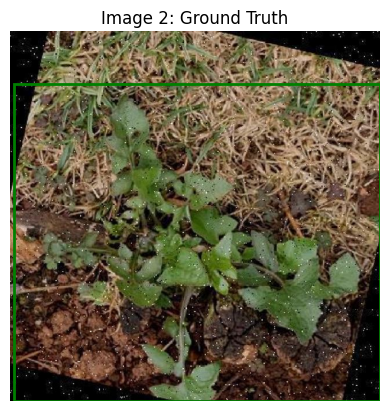

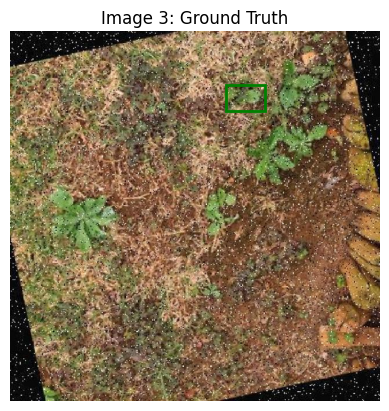

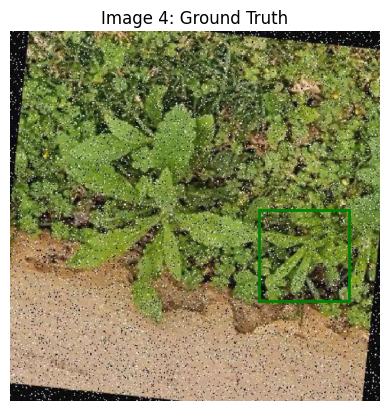

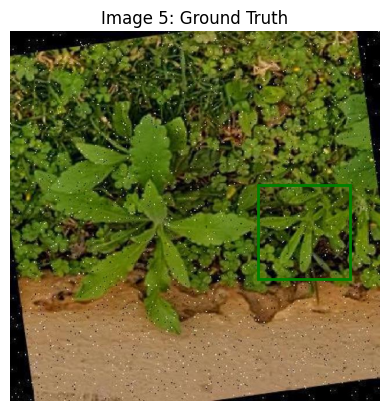

2024-11-18 16:37:17.208933: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [6]:
def visualize_images(dataset, num_images=5):
    for images, bboxes in dataset.take(1):  # Take one batch
        for i in range(num_images):
            image = images[i].numpy()
            bbox = bboxes[i].numpy()
            plt.imshow(image)
            plt.gca().add_patch(
                plt.Rectangle(
                    (bbox[0], bbox[1]),  # xmin, ymin
                    bbox[2] - bbox[0],  # width
                    bbox[3] - bbox[1],  # height
                    edgecolor='green',
                    facecolor='none',
                    linewidth=2
                )
            )
            plt.title(f"Image {i + 1}: Ground Truth")
            plt.axis("off")
            plt.show()

print("Visualizing the first 5 training images...")
visualize_images(train_dataset, num_images=5)

In [7]:
def build_model(max_objects=10):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(image_size[0], image_size[1], 3)),
        # Add deeper convolutional layers
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),  # First conv layer
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),  # Second conv layer
        tf.keras.layers.MaxPooling2D((2, 2)),
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),  # Third conv layer
        tf.keras.layers.MaxPooling2D((2, 2)),
        # Flatten and fully connected layers
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(64, activation='relu'),  # Smaller dense layer
        tf.keras.layers.Dense(128, activation='relu'),  # Larger dense layer
        # Output layer for bounding box predictions
        tf.keras.layers.Dense(4 * max_objects, activation='linear')  # Predict bounding box coordinates
    ])
    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])
    return model



In [8]:
# Set the maximum number of objects
max_objects = 10  # Adjust based on the dataset
# Build the model
model = build_model(max_objects=max_objects)
# Calculate steps per epoch
train_steps_per_epoch = train_samples // batch_size
valid_steps_per_epoch = valid_samples // batch_size
# Train the model
print("Training the model...")
model.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=50,
    steps_per_epoch=train_steps_per_epoch,
    validation_steps=valid_steps_per_epoch
)
# Save the model
model.save("models/weed_detection_model.h5")
print("Model saved as 'weed_detection_model.h5'")

Training the model...
Epoch 1/50


I0000 00:00:1731976639.184109  499368 service.cc:146] XLA service 0x7ff214207000 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731976639.184182  499368 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 3080, Compute Capability 8.6
2024-11-18 16:37:19.218810: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-18 16:37:19.413846: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907


  2/366 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - accuracy: 0.1500 - loss: 38531.9648   

I0000 00:00:1731976648.982933  499368 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


366/366 ━━━━━━━━━━━━━━━━━━━━ 70s 162ms/step - accuracy: 0.3007 - loss: 27938.1484 - val_accuracy: 0.2714 - val_loss: 18703.5176
Epoch 2/50
366/366 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - accuracy: 0.3677 - loss: 24637.8047 - val_accuracy: 0.2771 - val_loss: 18844.0664
Epoch 3/50
366/366 ━━━━━━━━━━━━━━━━━━━━ 36s 97ms/step - accuracy: 0.3589 - loss: 24756.2793 - val_accuracy: 0.2771 - val_loss: 18138.3320
Epoch 4/50
366/366 ━━━━━━━━━━━━━━━━━━━━ 35s 95ms/step - accuracy: 0.3672 - loss: 24768.2109 - val_accuracy: 0.2771 - val_loss: 19983.0156
Epoch 5/50
366/366 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - accuracy: 0.3554 - loss: 24901.6445 - val_accuracy: 0.2686 - val_loss: 19620.2207
Epoch 6/50
366/366 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - accuracy: 0.3566 - loss: 25347.9492 - val_accuracy: 0.4086 - val_loss: 19593.8379
Epoch 7/50
366/366 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - accuracy: 0.3520 - loss: 24624.2773 - val_accuracy: 0.4057 - val_loss: 17783.2109
Epoch 8/50
366/366 ━━━━━━━━━━━━━━━━━━━━ 33s 

Model saved as 'weed_detection_model.h5'


Evaluating the model...
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - accuracy: 0.4744 - loss: 17967.2930
Test accuracy: 0.44
Visualizing predictions...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


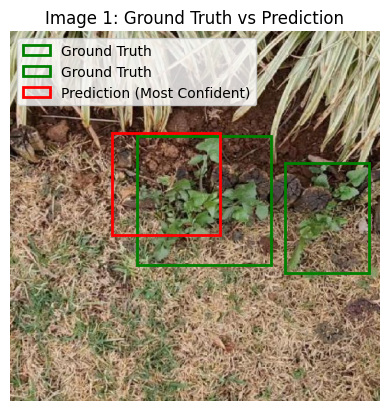

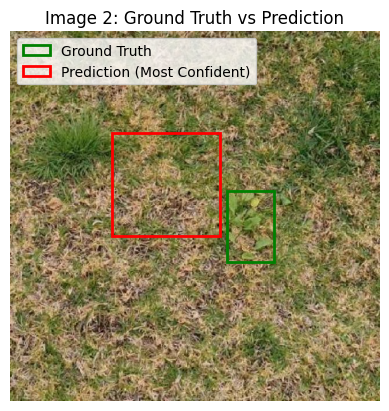

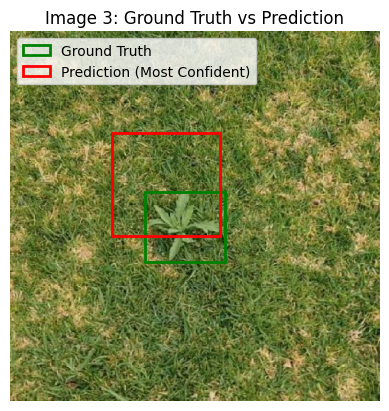

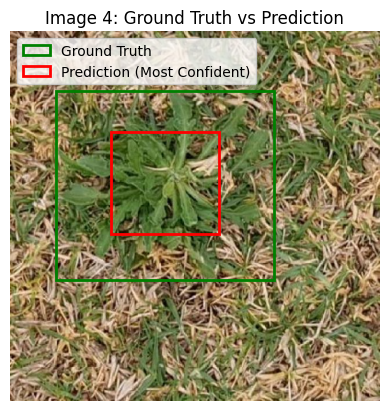

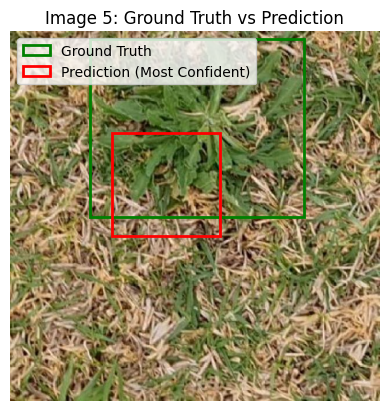

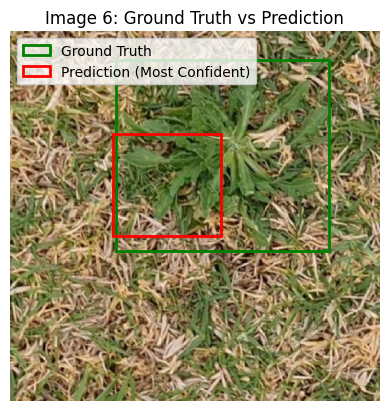

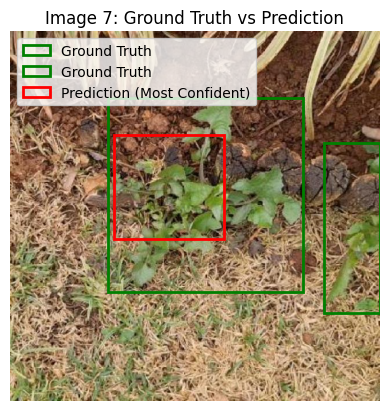

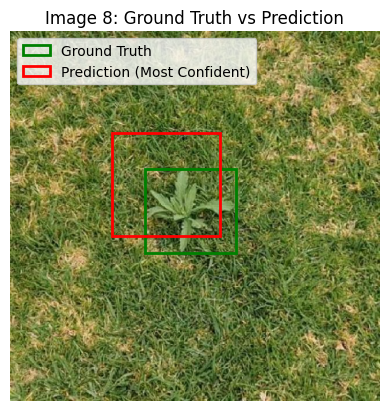

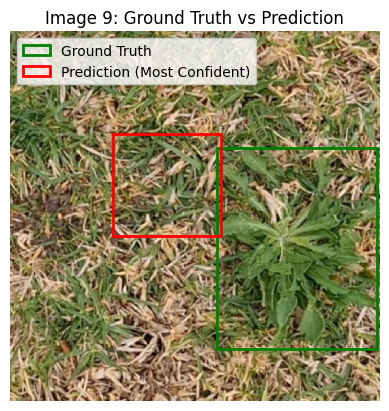

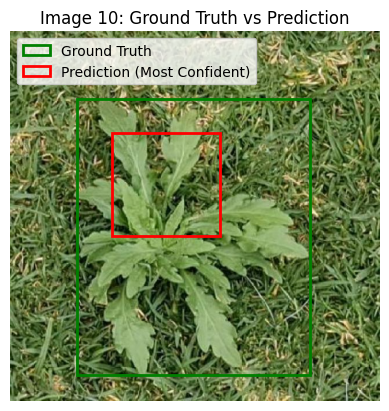

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


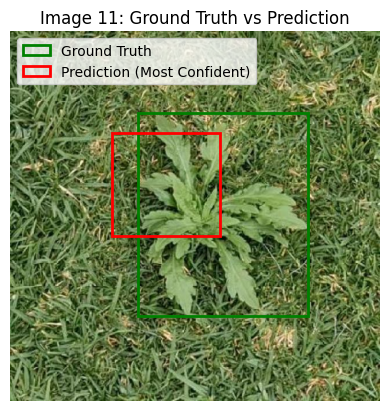

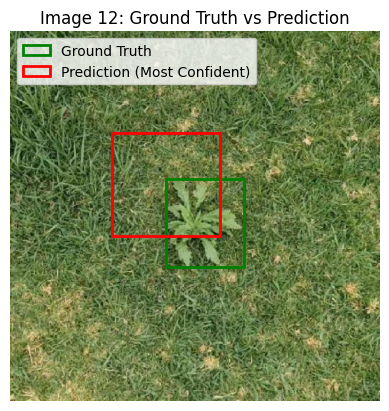

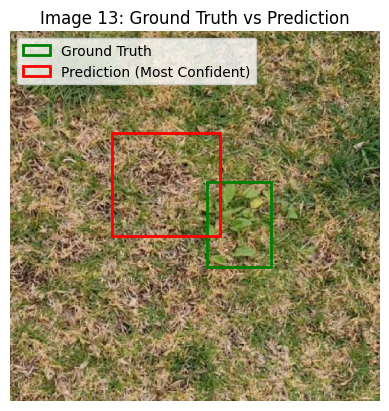

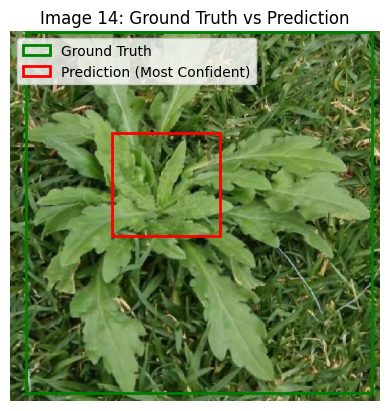

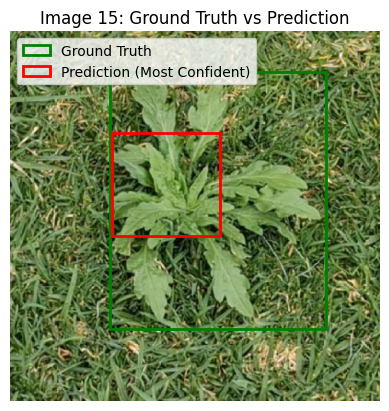

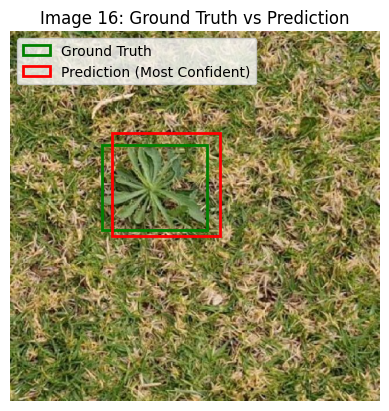

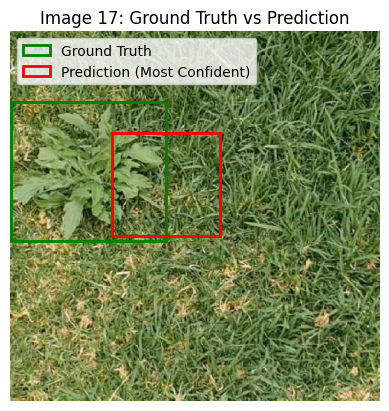

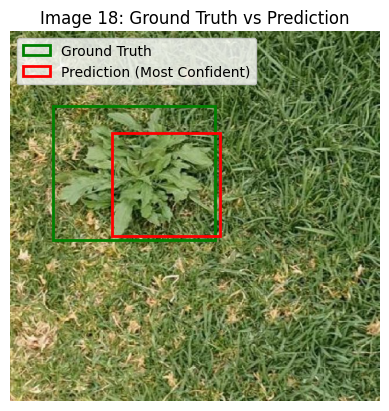

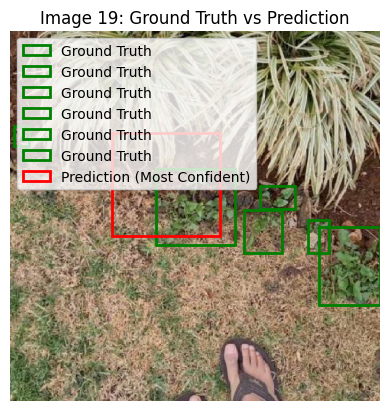

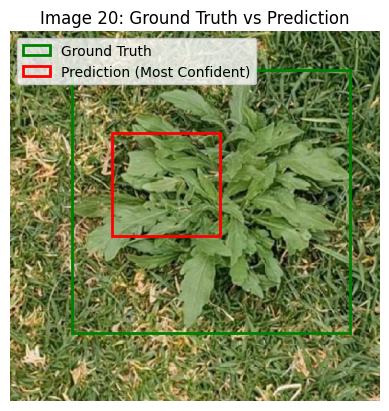

In [9]:
test_steps = test_samples // batch_size
# Evaluate the model
print("Evaluating the model...")
test_loss, test_acc = model.evaluate(test_dataset, steps=test_steps)
print(f"Test accuracy: {test_acc:.2f}")
def visualize_predictions(dataset, model, num_images=20):
    visualized_count = 0
    for images, ground_truth_boxes in dataset:
        # Get predictions for the current batch
        predictions = model.predict(images)
        # Determine how many images to process in this batch
        batch_size = images.shape[0]
        num_to_visualize = min(num_images - visualized_count, batch_size)
        for i in range(num_to_visualize):
            image = images[i].numpy()
            ground_truth = ground_truth_boxes[i].numpy()
            prediction = predictions[i]
            # Plot the image
            plt.imshow(image)
            for j in range(0, len(ground_truth), 4):
                xmin, ymin, xmax, ymax = ground_truth[j:j+4]
                if xmin == ymin == xmax == ymax == 0:
                    continue
                plt.gca().add_patch(
                    plt.Rectangle(
                        (xmin, ymin),  # Top-left corner
                        xmax - xmin,  # Width
                        ymax - ymin,  # Height
                        edgecolor='green',
                        facecolor='none',
                        linewidth=2,
                        label="Ground Truth"
                    )
                )
            if len(prediction) >= 4:
                xmin, ymin, xmax, ymax = prediction[:4]  # First predicted bounding box
                plt.gca().add_patch(
                    plt.Rectangle(
                        (xmin, ymin),  # Top-left corner
                        xmax - xmin,  # Width
                        ymax - ymin,  # Height
                        edgecolor='red',
                        facecolor='none',
                        linewidth=2,
                        label="Prediction (Most Confident)"
                    )
                )
            plt.title(f"Image {visualized_count + 1}: Ground Truth vs Prediction")
            plt.axis("off")
            plt.legend(loc="upper left")
            plt.show()
            visualized_count += 1
            if visualized_count >= num_images:
                return

print("Visualizing predictions...")
visualize_predictions(test_dataset, model, 20)